비트(beat)와 펄스(pulse) 추적(tracking)에 대해 다룬다. 지배적 로컬 펄스(PLP)에 대해 알아보고, 동적 프로그래밍을 통한 비트 추적, 그리고 적응형 윈도우에 대해 예시와 함께 본다.

> 이 글은 [FMP(Fundamentals of Music Processing) Notebooks](https://www.audiolabs-erlangen.de/resources/MIR/FMP/C0/C0.html)을 참고로 합니다.

In [1]:
import numpy as np
from scipy import signal
from scipy.interpolate import interp1d
import  matplotlib.pyplot as plt
import librosa
import librosa.display
import pandas as pd

import IPython.display as ipd
from IPython.display import Image, Audio

from utils.plot_tools import *
from utils.feature_tools import normalize_feature_sequence
from utils.chord_tools import read_structure_annotation
from utils.tempo_tools import read_annotation_pos, compute_novelty_spectrum, resample_signal, plot_signal_kernel
from utils.tempo_tools import compute_sinusoid_optimal, compute_tempogram_fourier, compute_tempogram_autocorr

path_img = '../img/7.tempo_and_beat_tracking/'
path_data = '../data_FMP/'

# Predominant Local Pulse (PLP)

- 비트 및 펄스 추적(tracking) 작업은 속도(rate) 외에도 펄스의 위상(pahse)도 고려한다는 점에서 템포 추정의 확장으로 볼 수 있다.

- 푸리에 템포그램의 아이디어는 주어진 노벨티 곡선을 윈도우 정현파(windowed sinusoid)와 로컬적으로 비교하는 것이었다. 이 아이디어를 바탕으로 매 시간 위치에 대해 노벨티 함수의 로컬 피크 구조를 가장 잘 포착하는 윈도우(windowed) 정현파를 결정한다.

- 윈도우 정현파를 개별적으로 보는 대신 시간이 지남에 따라 모든 정현파를 누적하여 "overlap-add" 기술을 사용하는 것이 중요하다. 그 결과, 원래의 노벨티 함수의 로컬 주기성 향상으로 간주될 수 있는 단일 함수를 얻는다.

- **Predominant local pulse**(**PLP**) 정보를 표시하는 이 표현을 **PLP function**이라고 한다. 이 맥락에서 기본 노벨티 함수에서 측정할 수 있는 가장 강한 펄스 수준을 나타내기 위해 다소 느슨한 방식으로 "**predominant pulse**"이라는 용어를 사용한다.

- 직관적으로 PLP 함수는 기저에 있는 노벨티 함수이 로컬적으로 주기적인 패턴을 소유하는 한 템포의 연속적이고 급격한 변화에 적응할 수 있는 펄스 추적기로 간주할 수 있다.

## 최적 윈도우-정현파 (Optimal Windowed Sinusoids)

- 노벨티 함수 $\Delta:\mathbb{Z}\to\mathbb{R}$가 주어졌을 때, 다음과 같이 정의된 복소 푸리에 계수 $\mathcal{F}(n,\omega)$에서 푸리에 템포그램을 도출한 바 있다.
$$\tau_n := \underset{\tau\in\Theta}{\mathrm{argmax}} \mathcal{T}^\mathrm{F}(n,\tau).$$
    
- 이로부터 다음과 같이 설정하여 푸리에 템포그램을 얻었다.
$$\mathcal{T}^\mathrm{F}(n,\tau) = |\mathcal{F}(n,\tau/60)|$$
    
- 각 시간 위치 $n\in\mathbb{Z}$에 대해 이제 $\mathcal{T}^\mathrm{F}(n,\tau)$를 최대화하는 템포 매개변수 $\tau_n\in \Theta$를 고려한다:
$$\tau_n := \underset{\tau\in\Theta}{\mathrm{argmax}} \mathcal{T}^\mathrm{F}(n,\tau)$$

- 푸리에 계수 $\mathcal{F}(n,\omega)$로 인코딩된 **위상 정보**(**phase information**)는 $n$ 노벨티 함수 $\Delta$의 로켈 섹션과 가장 잘 상관되는 템포 $\tau_n$의 윈도우 정현파의 위상 $\varphi_n$을 유도하는 데 사용할 수 있다.

- 위상은 다음과 같이 주어지며, 복소수의 각은 래디언(radians)으로 주어진다($[0,2\pi)$ 안의 숫자).
$$\varphi_n = - \frac{1}{2\pi} \mathrm{angle}\big( \mathcal{F}(n,\tau_n/60) \big)$$
    
- $\tau_n$ 및 $\varphi_n$를 기반으로, 아래의 설정을 통해 **최적 윈도우 정현파(optimal windowed sinusoid)** $\kappa_n:\mathbb{Z}\to \mathbb{R}$를 정의한다.
$$\kappa_n(m) := w(m-n) \cos\Big(2\pi \big((\tau_n/60)\cdot m - \varphi_n\big)\Big)$$
for each time point $n\in\mathbb{Z}$
    - 푸리에 템포그램과 마찬가지로 윈도우 함수 $w$를 사용

- 직관적으로 정현파 $\kappa_n$은 템포 집합 $\Theta$와 관련하여 시간 위치 $n$에서 노벨티 함수의 로컬 주기적 특성을 가장 잘 설명한다. 

- 주기 $60/\tau_n$은 노벨티 함수의 지배적 주기성(predominant periodicity)에 해당하며 위상 정보 $\varphi_n$은 $\kappa_n$의 최대값과 노벨티 함수의 피크를 정확하게 정렬한다. 정현파 $\kappa_n$의 관련성은 노벨티 함수의 퀄리티뿐 만이 아니라, $w$의 윈도우 크기와 템포 집합 $\Theta$에 따라서도 달라진다.

**예: Shostakovich**

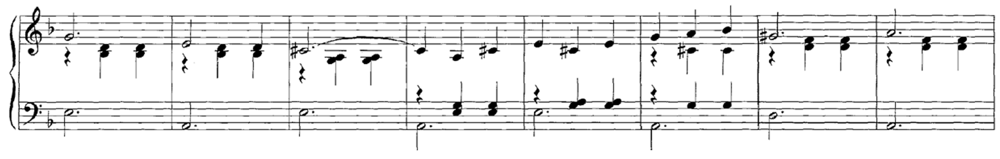

In [2]:
Image(path_img+"FMP_C6_F07_Shostakovich_Waltz-02-Section_Score.png", width=600)

- 다음 그림에서는 Shostakovich 음악에 대한 푸리에 기반 템포그램을 보여준다. 또한 템포그램 시각화에서 빨간색 점으로 표시된 다양한 시간-템포 쌍에 대한 기저의 노벨티 함수 위에 그려진 최적 정현파 커널을 보여준다.

In [3]:
fn_wav = 'FMP_C6_F07_Shostakovich_Waltz-02-Section_IncreasingTempo.wav'
x, Fs = librosa.load(path_data+fn_wav) 
ipd.display(data=x,rate=Fs)

nov, Fs_nov = compute_novelty_spectrum(x, Fs=Fs, N=2048, H=512, 
                                                 gamma=100, M=10, norm=True)
nov, Fs_nov = resample_signal(nov, Fs_in=Fs_nov, Fs_out=100)

N = 500 #corresponding to 5 seconds (Fs_nov = 100 Hz)
H = 10  #Hopsize leading to a tempogram resolution of 10 Hz
Theta = np.arange(30, 601) #Tempo range parameter
X, T_coef, F_coef_BPM = compute_tempogram_fourier(nov, Fs=Fs_nov, N=N, H=H, 
                                                            Theta=Theta)
tempogram = np.abs(X)

t_nov = np.arange(nov.shape[0]) / Fs_nov
coef_n = np.array([0, 10, 20, 30, 40, 50, 60])
coef_k = np.zeros(len(coef_n), dtype=int)

for i in range(len(coef_n)):
    coef_k[i] = np.argmax(tempogram[:,coef_n[i]])

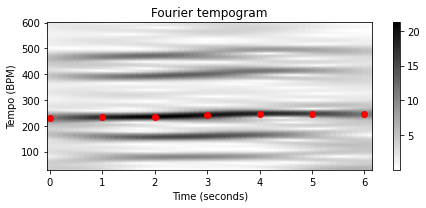

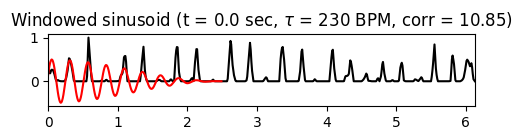

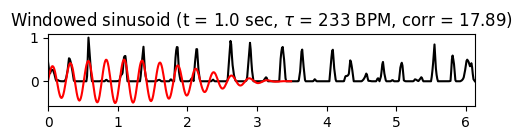

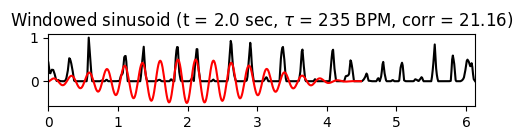

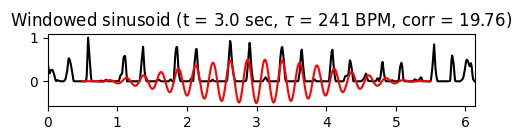

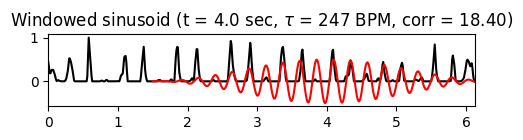

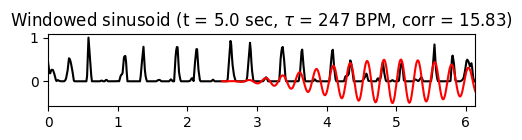

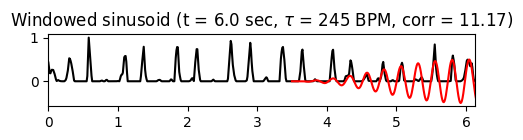

In [4]:
fig, ax, im = plot_matrix(tempogram, T_coef=T_coef, F_coef=F_coef_BPM, 
                                   figsize=(6.5, 3), ylabel='Tempo (BPM)',
                                   title='Fourier tempogram')
ax[0].plot(T_coef[coef_n], F_coef_BPM[coef_k], 'ro')

for i in range(len(coef_n)):
    n = coef_n[i]
    k = coef_k[i]
    tempo = F_coef_BPM[k]
    time = T_coef[n]
    corr = np.abs(X[k,n])
    kernel, t_kernel, t_kernel_sec = compute_sinusoid_optimal(X[k,n], 
                                            F_coef_BPM[k], n, Fs_nov, N, H)
    title=r'Windowed sinusoid (t = %0.1f sec, $\tau$ = %0.0f BPM, corr = %0.2f)'% (time, tempo, corr)
    plot_signal_kernel(nov, t_nov, 0.5*kernel, t_kernel_sec, 
                                 figsize=(5, 1.5), title=title)     

## PLP 함수의 정의 
- 심하게 손상된 피크 구조를 가진 영역에서 최적 윈도우 정현파을 추정하는 것은 문제가 있다. 이는 특히 윈도우 크기가 작은 경우에 그렇다.

- 시간적 유연성을 유지하면서 주기성(periodicity) 추정을 보다 견고하게 하기 위해, 정현파를 하나씩 보는 대신 단일 함수를 형성한다. 이를 위해 **overlap-add** 기술을 적용한다. 여기서 최적의 윈도우 정현파 $\kappa_n$는 모든 시간 위치 $n\in\mathbb{Z}$에 걸쳐 누적된다.

- 또한 함수 결과의 양의 부분만 고려한다. 더 정확하게는 함수 $\Gamma:\mathbb{Z}\to\mathbb{R}_{\geq 0}$를 다음과 같이 정의한다(half-wave rectification 사용).
$$\Gamma(m) =\big|\textstyle \sum_{n\in \mathbb{Z}}  \kappa_n(m)\big|_{\geq 0}$$
for $n\in\mathbb{Z}$


- 결과는 PLP 함수라고 부르는 중간 수준(mid-level) 표현이다.

- 아래의 예에서 PLP의 계산 단계를 다음과 같은 그림으로 본다.
    * 노벨티 곡선
    * 프레임별 최대값이 있는 푸리에 템포그램 (시각화 목적으로 7개의 시간 위치 $n$에 대해서만 표시됨)
    * $5$초의 윈도우 크기를 사용하는 최적의 윈도우 정현파 $\kappa_n$ (7개 위치에 대해서만 표시됨)
    * 모든 시간 프레임에 걸친 최적 정현파의 축적 (overlap-add)
    * 반파 정류기(Half-wave rectification) 이후 얻은 PLP 함수 $\Gamma$

In [5]:
L = nov.shape[0]
N_left = N // 2
L_left = N_left
L_right = N_left
L_pad = L + L_left + L_right
t_pad = np.arange(L_pad)

t_nov = np.arange(nov.shape[0]) / Fs_nov
coef_n = np.array([0, 10, 20, 30, 40, 50, 60])
coef_k = np.zeros(len(coef_n), dtype=int)

for i in range(len(coef_n)):
    coef_k[i] = np.argmax(tempogram[:, coef_n[i]])

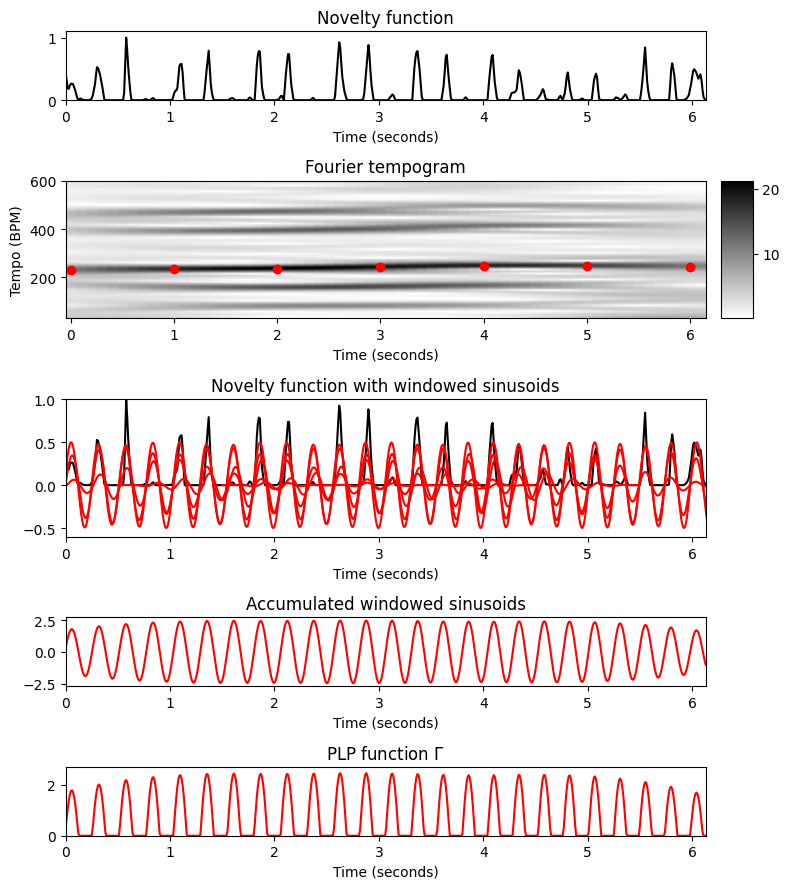

In [6]:
fig, ax = plt.subplots(5, 2, gridspec_kw={'width_ratios': [1, 0.05], 
                                          'height_ratios': [1, 2, 2, 1, 1]}, figsize=(8, 9))        

plot_signal(nov, Fs_nov, ax=ax[0, 0], color='k', title='Novelty function')
ax[0, 1].set_axis_off()

plot_matrix(tempogram, T_coef=T_coef, F_coef=F_coef_BPM, ax=[ax[1,0], ax[1,1]], 
                     title='Fourier tempogram', ylabel='Tempo (BPM)', colorbar=True)
ax[1, 0].plot(T_coef[coef_n], F_coef_BPM[coef_k], 'ro')

plot_signal(nov, Fs_nov, ax=ax[2, 0], color='k', title='Novelty function with windowed sinusoids')
ax[2, 1].set_axis_off()

nov_PLP = np.zeros(L_pad)
for i in range(len(coef_n)):
    n = coef_n[i]
    k = coef_k[i]
    tempo = F_coef_BPM[k]
    time = T_coef[n]
    kernel, t_kernel, t_kernel_sec = compute_sinusoid_optimal(X[k, n], F_coef_BPM[k], n, Fs_nov, N, H)    
    nov_PLP[t_kernel] = nov_PLP[t_kernel] + kernel
    ax[2, 0].plot(t_kernel_sec, 0.5 * kernel, 'r')
    ax[2, 0].set_ylim([-0.6, 1])
    
nov_PLP = nov_PLP[L_left:L_pad-L_right]
plot_signal(nov_PLP, Fs_nov, ax=ax[3, 0], color='r', title='Accumulated windowed sinusoids')
ax[3,1].set_axis_off()

nov_PLP[nov_PLP < 0] = 0
plot_signal(nov_PLP, Fs_nov, ax=ax[4, 0], color='r', title='PLP function $\Gamma$')
ax[4, 1].set_axis_off()

plt.tight_layout()

- 서로 다른 윈도우 정현파의 최대값이 노벨티 함수의 피크뿐만 아니라 겹치는 영역에서 이웃 정현파의 최대값과도 잘 정렬되는 것을 볼 수 있다. 이는 **보강 간섭**(**constructive interferences**)으로 이어진다.

- 푸리에 템포그램에서 알 수 있듯이 지배적 템포는 약 $\tau=225~\mathrm{BPM}$에서 시작한 약간의 템포 증가와 함께 전체에서는 $200$와 $250~\mathrm{BPM}$ 사이를 가진다. 

- 7개의 서로 다른 시간 위치에 대해 최대화 템포 값과 해당 최적의 윈도우 정현파가 표시된다. 이러한 각각의 윈도우 정현파는 약한 피크와 "이상적인" 주기성(periodicity)의 작은 편차가 균형을 이루는 노벨티 함수의 피크 구조의 로컬 주기적 특성을 설명하려고 한다. 또한, 이러한 펄스 위치 중 일부는 원래의 노벨티 함수에서 다소 약하지만 지배적인 펄스 위치는 $\Gamma$의 피크로 명확하게 표시된다. 이런 의미에서 PLP 함수는 지배적 펄스 레벨이 고려된 원래의 노벨티 함수의 **로컬 주기성(local periodicity) 향상**으로 볼 수 있다.


- 다음 코드 셀에서 복소수 푸리에 템포그램을 입력으로 하고 PLP 함수를 출력하는 함수를 정의한다. 여기서 최적의 윈도우 정현파 $\kappa_n$는 모든 템포그램 프레임 $n$에 걸쳐 누적된다.

- 시각화는 일부 **피크 선택(peak-picking) 전략**으로 얻은 피크와 함께 결과 PLP 함수뿐만 아니라 원래의 노벨티 함수를 보여준다. 또한, 원본 오디오 녹음에 클릭 트랙을 통해 **피크 소니피케이션**이 추가된다.

In [7]:
def compute_plp(X, Fs, L, N, H, Theta):
    """Compute windowed sinusoid with optimal phase

    Args:
        X (np.ndarray): Fourier-based (complex-valued) tempogram
        Fs (scalar): Sampling rate
        L (int): Length of novelty curve
        N (int): Window length
        H (int): Hop size
        Theta (np.ndarray): Set of tempi (given in BPM)

    Returns:
        nov_PLP (np.ndarray): PLP function
    """
    win = np.hanning(N)
    N_left = N // 2
    L_left = N_left
    L_right = N_left
    L_pad = L + L_left + L_right
    nov_PLP = np.zeros(L_pad)
    M = X.shape[1]
    tempogram = np.abs(X)
    for n in range(M):
        k = np.argmax(tempogram[:, n])
        tempo = Theta[k]
        omega = (tempo / 60) / Fs
        c = X[k, n]
        phase = - np.angle(c) / (2 * np.pi)
        t_0 = n * H
        t_1 = t_0 + N
        t_kernel = np.arange(t_0, t_1)
        kernel = win * np.cos(2 * np.pi * (t_kernel * omega - phase))
        nov_PLP[t_kernel] = nov_PLP[t_kernel] + kernel
    nov_PLP = nov_PLP[L_left:L_pad-L_right]
    nov_PLP[nov_PLP < 0] = 0
    return nov_PLP

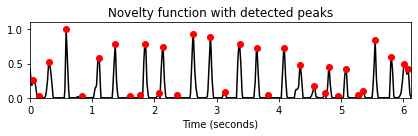

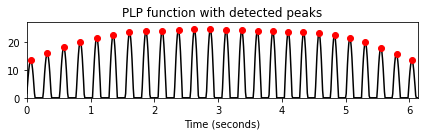

In [8]:
fn_wav = 'FMP_C6_F07_Shostakovich_Waltz-02-Section_IncreasingTempo.wav'
x, Fs = librosa.load(path_data+fn_wav) 

nov, Fs_nov = compute_novelty_spectrum(x, Fs=Fs, N=2048, H=512, 
                                                 gamma=100, M=10, norm=True)
nov, Fs_nov = resample_signal(nov, Fs_in=Fs_nov, Fs_out=100)

L = len(nov)
N = 500
H = 10
Theta = np.arange(30, 601)
X, T_coef, F_coef_BPM = compute_tempogram_fourier(nov, Fs=Fs_nov, N=N, H=H, 
                                                            Theta=Theta)
nov_PLP = compute_plp(X, Fs_nov, L, N, H, Theta)

t_nov = np.arange(nov.shape[0]) / Fs_nov
peaks, properties = signal.find_peaks(nov, prominence=0.02) #scipy
peaks_sec = t_nov[peaks]
plot_signal(nov, Fs_nov, color='k', title='Novelty function with detected peaks');
plt.plot(peaks_sec, nov[peaks], 'ro')
plt.show()
x_peaks = librosa.clicks(times=peaks_sec, sr=Fs, click_freq=1000, length=len(x))
ipd.display(Audio(data = x + x_peaks, rate=Fs))

peaks, properties = signal.find_peaks(nov_PLP, prominence=0.02)
peaks_sec = t_nov[peaks]
plot_signal(nov_PLP, Fs_nov, color='k', title='PLP function with detected peaks');
plt.plot(peaks_sec, nov_PLP[peaks], 'ro')
plt.show()
x_peaks = librosa.clicks(times=peaks_sec, sr=Fs, click_freq=1000, length=len(x))
ipd.display(Audio(data=x + x_peaks, rate=Fs))

**예시: Brahms**

- 두 번째 예로 Brahms의 헝가리 무곡 5번 오케스트라를 보자. 작은 발췌 부분(녹음의 $t_1=35~\mathrm{sec}$ 및 $t_2=53~\mathrm{sec}$ 사이의 섹션)만 고려하며, measure $26$ ~ $38$이 재생된다. 녹음의 전체 **음악적 구조** $A_1A_2B_1B_2CA_3B_3B_4D$와 관련하여, 발췌 부분은 $A_2$ 섹션에서 $B_1$ 섹션으로의 전환으로 구성된다.

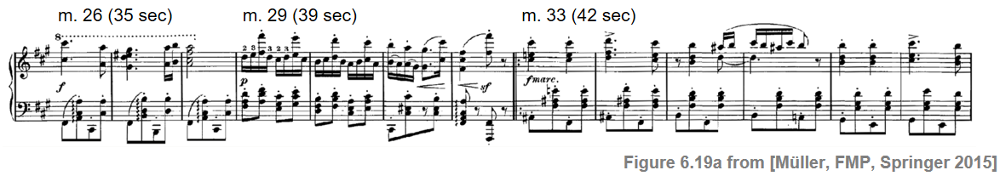

In [9]:
Image(path_img+"FMP_C6_F19a.png", width=700)

- 중요한 로컬 템포 변경으로 인해 템포 추정 및 펄스 추적이 쉽지 않다. 4분 음표 펄스 레벨을 고려하여 수동적으로 본 결과,
    * $90~\mathrm{BPM}$의 템포로 시작(measures $26$&ndash;$28$, seconds $35$&ndash;$39$),
    * 그런 다음 갑자기 $140~\mathrm{BPM}$로 변경(measures $29$&ndash;$32$, seconds $39$&ndash;$41$),
    * 그리고 $75~\mathrm{BPM}$(measures $33$&ndash;$38$, seconds $41$&ndash;$53$)로 계속된다.

- 많은 음의 온셋 부분이 노벨티 함수로 제대로 캡처되지 않는다. 더욱이 다이나믹(dynamics)에서 큰 차이 때문에, 어떤 음 온셋과도 관련되지 않은 가짜 피크와 거의 구별할 수 없는 일부 약한 온셋이 있으며, 노벨티 함수을 지배하는 일부 강한 온셋도 있다. 결과적으로 피크의 높이가 반드시 타당성을 나타내는 유일한 지표는 아니다.

- 이러한 문제에도 불구하고 템포는 8분 음표 펄스 레벨(4분 음표 템포의 두 번째 고조파)에서 푸리에 템포그램에 의해 잘 반영된다. 손상되었지만 노벨티 함수의 피크 구조는 여전히 로컬 주기적 규칙성을 가지며, 이는 지배적인 로컬 템포에 해당하는 윈도우 정현파에 의해 캡처된다.

- 결과 PLP 함수 $\Gamma$는 8분음표 레벨에서 펄스 위치를 표시할 수 있다.

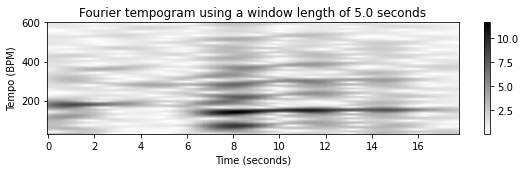

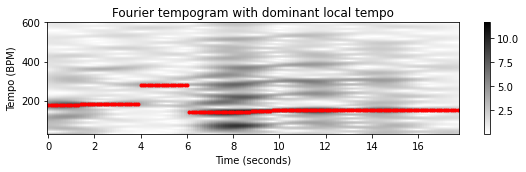

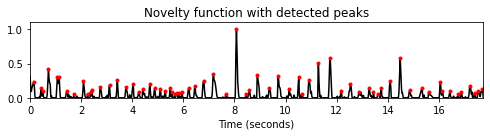

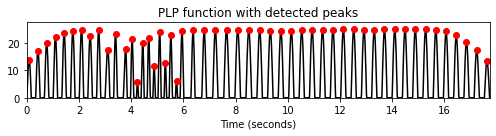

In [10]:
fn_wav = 'FMP_C6_F19_Brahms_Ormandy_sec35-53.wav'
x, Fs = librosa.load(path_data+fn_wav)

nov, Fs_nov = compute_novelty_spectrum(x, Fs=Fs, N=2048, H=512, 
                                                 gamma=100, M=10, norm=True)
nov, Fs_nov = resample_signal(nov, Fs_in=Fs_nov, Fs_out=100)

N = 500
H = 10
Theta = np.arange(30, 601)
L = len(nov)
X, T_coef, F_coef_BPM = compute_tempogram_fourier(nov, Fs=Fs_nov, N=N, H=H, 
                                                            Theta=Theta)
nov_PLP = compute_plp(X, Fs_nov, L, N, H, Theta)

tempogram = np.abs(X)
title = 'Fourier tempogram using a window length of %0.1f seconds'%(N/Fs_nov)
plot_matrix(tempogram, T_coef=T_coef, F_coef=F_coef_BPM, figsize=(8,2.5),
                     title=title, ylabel='Tempo (BPM)', colorbar=True);
fig, ax, im = plot_matrix(tempogram, T_coef=T_coef, F_coef=F_coef_BPM, 
                                   figsize=(8,2.5), ylabel='Tempo (BPM)', colorbar=True,
                                   title='Fourier tempogram with dominant local tempo') 
coef_k = np.argmax(tempogram, axis=0)
ax[0].plot(T_coef, F_coef_BPM[coef_k], 'r.')

t_nov = np.arange(nov.shape[0]) / Fs_nov
peaks, properties = signal.find_peaks(nov, prominence=0.05)
peaks_sec = t_nov[peaks]
plot_signal(nov, Fs_nov, color='k', figsize=(7,2),
                     title='Novelty function with detected peaks');
plt.plot(peaks_sec, nov[peaks], 'r.')
plt.show()
x_peaks = librosa.clicks(times=peaks_sec, sr=Fs, click_freq=1000, length=len(x))
ipd.display(Audio(data=x + x_peaks, rate=Fs))

peaks, properties = signal.find_peaks(nov_PLP, prominence=0.05)
peaks_sec = t_nov[peaks]
plot_signal(nov_PLP, Fs_nov, color='k', figsize=(7,2),
                     title='PLP function with detected peaks');
plt.plot(peaks_sec, nov_PLP[peaks], 'ro')
plt.show()
x_peaks = librosa.clicks(times=peaks_sec, sr=Fs, click_freq=1000, length=len(x))
ipd.display(Audio(data=x + x_peaks, rate=Fs))

## 정현파 윈도우 길이의 종속성 (Dependency of Sinusoid Window Length)

- PLP 함수를 계산할 때 많은 매개변수가 있다. 우선, 최종 결과는 다양한 방법으로 계산될 수 있는 인풋 노벨티 곡선에 따라 달라진다. 여기서는 푸리에 템포그램을 계산하는 데 사용되는 윈도우 정현파의 길이를 자세히 살펴본다.

- 분명히 모순되는 원칙들 사이 trade-off가 있다. 더 긴 윈도우를 사용하면 더 정확하고 강력한 템포 추정치를 얻을 수 있지만, 시간적 유연성이 떨어진다. 대조적으로, 더 짧은 창을 사용하면 시간 해상도가 증가하지만, 템포 추정이 더 취약해진다.

- 브람스 예를 통해 이 장단점을 볼 수 있다. 첫 번째 경우 12초에 해당하는 윈도우 길이를 사용하고 두 번째 경우에는 2초에 불과한 윈도우 길이를 사용한다.

In [11]:
def compute_plot_tempogram_plp(fn_wav, Fs=22050, N=500, H=10, Theta=np.arange(30, 601),
                               title='', figsize=(8, 4), plot_maxtempo=False):
    """Compute and plot Fourier-based tempogram and PLP function

    Args:
        fn_wav: Filename of audio file
        Fs: Sample rate (Default value = 22050)
        N: Window size (Default value = 500)
        H: Hop size (Default value = 10)
        Theta: Set of tempi (given in BPM) (Default value = np.arange(30, 601))
        title: Title of figure (Default value = '')
        figsize: Figure size (Default value = (8, 4))
        plot_maxtempo: Visualize tempo with greatest coefficients in tempogram (Default value = False)
    """
    x, Fs = librosa.load(fn_wav)

    nov, Fs_nov = compute_novelty_spectrum(x, Fs=Fs, N=2048, H=512, gamma=100, M=10, norm=True)
    nov, Fs_nov = resample_signal(nov, Fs_in=Fs_nov, Fs_out=100)

    L = len(nov)
    H = 10
    X, T_coef, F_coef_BPM = compute_tempogram_fourier(nov, Fs=Fs_nov, N=N, H=H, Theta=Theta)
    nov_PLP = compute_plp(X, Fs_nov, L, N, H, Theta)
    tempogram = np.abs(X)

    fig, ax = plt.subplots(2, 2, gridspec_kw={'width_ratios': [1, 0.05],
                                              'height_ratios': [2, 1]},
                           figsize=figsize)
    plot_matrix(tempogram, T_coef=T_coef, F_coef=F_coef_BPM, title=title,
                         ax=[ax[0, 0], ax[0, 1]], ylabel='Tempo (BPM)', colorbar=True)
    if plot_maxtempo:
        coef_k = np.argmax(tempogram, axis=0)
        ax[0, 0].plot(T_coef, F_coef_BPM[coef_k], 'r.')

    t_nov = np.arange(nov.shape[0]) / Fs_nov
    peaks, properties = signal.find_peaks(nov_PLP, prominence=0.05)
    peaks_sec = t_nov[peaks]
    plot_signal(nov_PLP, Fs_nov, color='k', ax=ax[1, 0])
    ax[1, 1].set_axis_off()
    ax[1, 0].plot(peaks_sec, nov_PLP[peaks], 'ro')
    plt.show()
    x_peaks = librosa.clicks(times=peaks_sec, sr=Fs, click_freq=1000, length=len(x))
    ipd.display(ipd.Audio(data=x + x_peaks, rate=Fs))

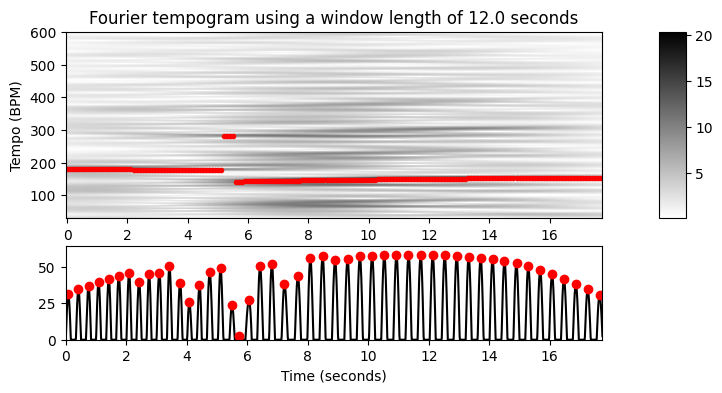

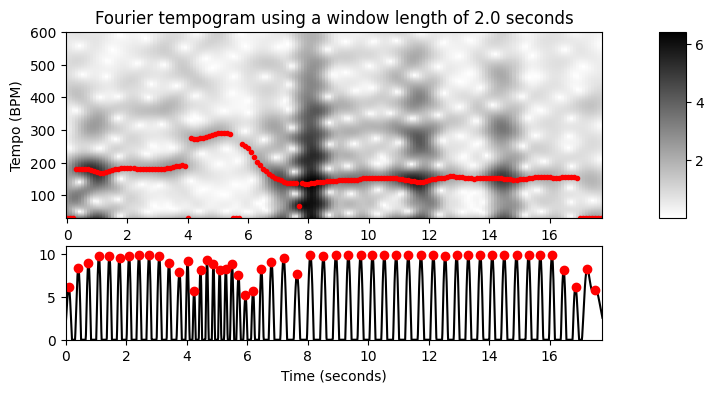

In [12]:
N=1200 # 12초
title='Fourier tempogram using a window length of %0.1f seconds'%(N/Fs_nov)
compute_plot_tempogram_plp(path_data+fn_wav, N=N, title=title, plot_maxtempo=True)

N=200 # 2초
title='Fourier tempogram using a window length of %0.1f seconds'%(N/Fs_nov)
compute_plot_tempogram_plp(path_data+fn_wav, N=N, title=title, plot_maxtempo=True)

## 템포 집합의 종속성 (Dependency of Tempo Set)

- 지배적인 템포를 결정하기 위해 프레임별 최대값을 취하는 것에는 장단점이 있다. 급격한 템포 변화에도 PLP 함수를 빠르게 조정할 수 있다는 장점이 있지만, 반면에 템포 옥타브 사이의 임의 전환과 같은 원치 않는 점프로 이어질 수 있다는 단점이 있다.

- Burgmüller의 Piano Etude Op. 100 No. 2의 시작 부분을 통해 이를 확인해 보자.

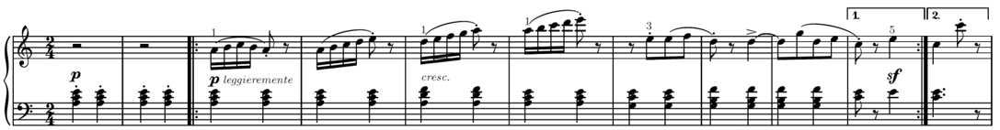

In [13]:
Image(path_img+"FMP_C6_F20a.png", width=700)

- 템포 집합 $\Theta=[30:600]$를 사용하면 4분음표와 8분음표 레벨 사이에 몇 가지 변화가 발생하는 PLP 함수가 생성된다.

- 최대화에서 템포 집합 $\Theta$를 제한할 때, 이러한 펄스 레벨의 전환을 피할 수 있다.
     * 예를 들어 제한된 집합 $\Theta=[60:200]$를 사용하면, 결과 PLP function은 대략 $130~\mathrm{BPM}$의 템포로 **4분음표**(**tactus**) 펄스 위치가 정확히 표시된다.
     * 집합 $\Theta=[200:340]$를 사용하면 **8분음표** 펄스 레벨의 위치가 표시된다.
     * 집합 $\Theta=[450:600]$를 사용하면 **16분음표**(**tatum**) 펄스 레벨의 위치가 표시된다.

- 즉, 예상되는 템포 범위에 대한 사전 지식을 PLP 프레임워크에 쉽게 통합하여 특정 수준의 펄스를 나타낼 수 있다.

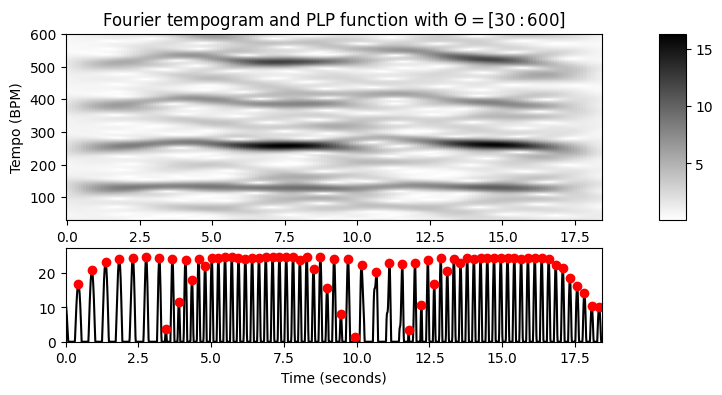

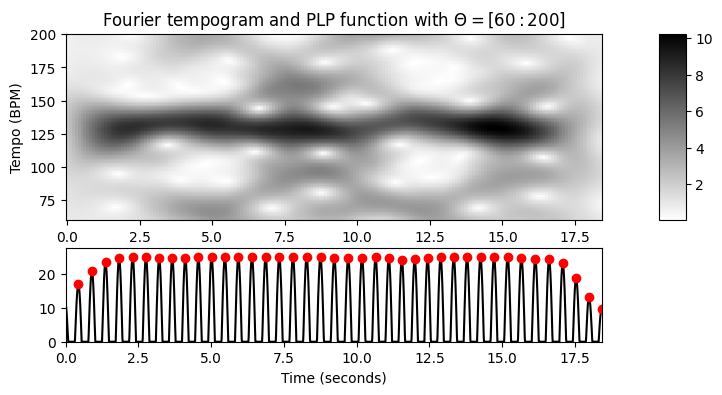

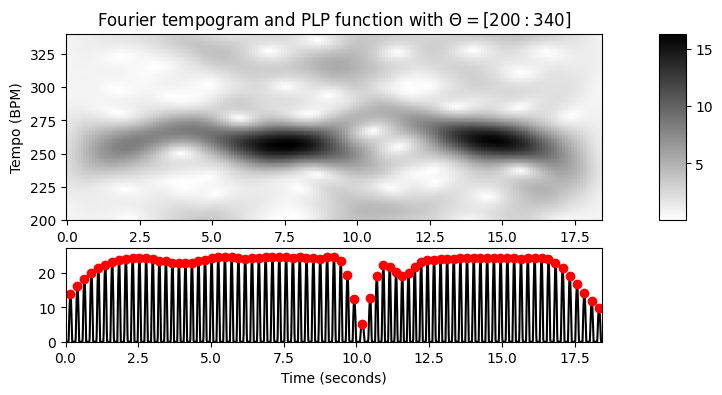

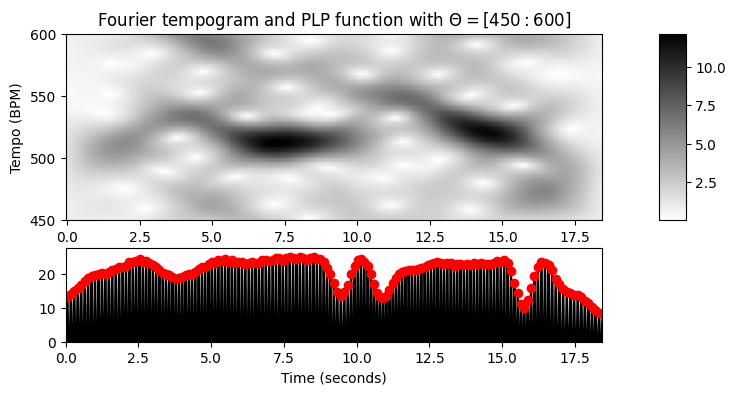

In [14]:
fn_wav = 'FMP_C6_F20_Burgmueller_Op100-02-FirstPart.wav'

title=r'Fourier tempogram and PLP function with $\Theta=[30:600]$'
compute_plot_tempogram_plp(path_data+fn_wav, N=500, Theta=np.arange(30, 601), title=title)

title=r'Fourier tempogram and PLP function with $\Theta=[60:200]$'
compute_plot_tempogram_plp(path_data+fn_wav, N=500, Theta=np.arange(60,201), title=title)

title=r'Fourier tempogram and PLP function with $\Theta=[200:340]$'
compute_plot_tempogram_plp(path_data+fn_wav, N=500, Theta=np.arange(200,341), title=title)

title=r'Fourier tempogram and PLP function with $\Theta=[450:600]$'
compute_plot_tempogram_plp(path_data+fn_wav, N=500, Theta=np.arange(450,601), title=title)

# 동적 프로그래밍을 이용한 비트 추적

## 모델링

- 템포가 거의 일정한, 강하고 꾸준한 박자를 가진 많은 종류의 음악이 있다. 이제 비트 위치가 가장 강한 음 온셋과 함께 진행되고, 템포가 거의 일정하다는 가정에 기반한 비트 추적 절차를 설명한다.

- 임의의 비트 시퀀스가 이 두 가지 가정을 얼마나 잘 반영하는지 측정하는 점수 함수를 구성한다. 점수를 최대화하는 비트 시퀀스는 최종 비트 추적 결과를 구성한다. 이러한 최적의 비트 시퀀스는 동적 프로그래밍(dynamic programming)을 사용하여 효율적으로 계산할 수 있다.

- 비트 추적 절차의 인풋은 노벨티 함수 $\Delta:[1:N]\to\mathbb{R}$와 전체적인 템포의 대략적인 추정치 $\hat{\tau}\in\mathbb{R}_{>0}$로 구성된다. 평소와 같이 $[1:N]$ 구간은 노벨티 계산에 사용되는 샘플링된 시간 축을 나타낸다고 가정한다. 템포 추정치 $\hat{\tau}$는 수동으로 지정하거나 자동화된 절차로 얻을 수 있다. $\hat{\tau}$ 및 피쳐 레이트에서 비트 주기에 대한 추정치를 도출할 수 있다. 

- 단순화를 위해 비트 주기가 샘플 또는 피쳐 인덱스(초 단위가 아닌)로 지정된다고 가정한다. $\hat{\delta}\in\mathbb{N}$를 이 숫자로 두자.  템포가 거의 일정하다고 가정하면 연속되는 두 비트의 차이 $\delta$는 $\hat{\delta}$에 가까워야 한다. 

- 이상적인 비트 기간 $\hat{\delta}$으로부터 $\delta$의 편차를 설명하기 위해 **페널티 함수**(**penalty function**) $P_{\hat{\delta}}:\mathbb{N}\to\mathbb{R}$를 다음과 같이 설정하여 도입한다.
$$P_{\hat{\delta}}(\delta) := - \big( \log_2 (\delta/\hat{\delta}) \big)^2$$
for $\delta\in\mathbb{N}$

- 이 함수는 $\delta=\hat{\delta}$에서 최대값이 0이고, 편차가 클수록 점점 음수 값을 나타낸다. 또한, 템포 편차는 본질적으로 상대적이기 때문에(템포를 두 배로 하는 것은 템포를 반으로 줄이는 것과 같은 정도로 페널티를 받아야 함), 페널티 함수는 로그 축에서 대칭으로 정의된다.

In [15]:
def compute_penalty(N, beat_ref):
    """| Compute penalty funtion used for beat tracking [FMP, Section 6.3.2]
    | Note: Concatenation of '0' because of Python indexing conventions

    Args:
        N (int): Length of vector representing penalty function
        beat_ref (int): Reference beat period (given in samples)

    Returns:
        penalty (np.ndarray): Penalty function
    """
    t = np.arange(1, N) / beat_ref
    penalty = -np.square(np.log2(t))
    t = np.concatenate((np.array([0]), t))
    penalty = np.concatenate((np.array([0]), penalty))
    return penalty

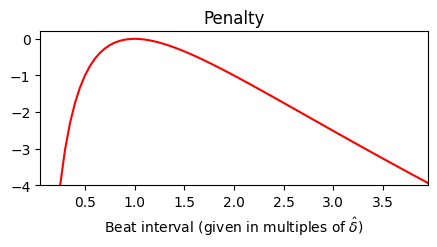

In [16]:
beat_ref = 20
N = 4 * beat_ref
penalty = compute_penalty(N, beat_ref)

plt.figure(figsize=(5, 2))
t = np.arange(0, N) / beat_ref
plt.plot(t, penalty, 'r')
plt.ylim([-4, 0.2])
plt.xlim([t[1], t[-1]])
plt.xlabel('Beat interval (given in multiples of $\hat{\delta}$)')
plt.title('Penalty')
plt.show()

- 주어진 $N\in\mathbb{N}$에 대해 $B = (b_1,b_2,\ldots,b_L)$는 비트 위치 $b_\ell\in[1:N]$ for $\ell\in[1:L]$을 강한 단조 증가하는(strictly monotonically increasing) 길이 $L\in\mathbb{N}_0$의 시퀀스라고 하자.

- 이하에서는 이러한 시퀀스를 **비트 시퀀스**(**beat sequence**)라고 한다. 정의에 따르면 $L=0$ 길이의 비트 시퀀스는 빈(empty) 시퀀스이다. 또한 $\mathcal{B}^N$은 주어진 매개변수 $N\in\mathbb{N}$에 대해 가능한 모든 비트 시퀀스로 구성된 집합을 나타낸다. 비트 시퀀스 $B\in\mathcal{B}^N$의 퀄리티를 측정하기 위해 노벨티 함수 $\Delta$의 양수 값과 페널티 함수 $P_{\hat{\delta}}$의 음수 값을 포함하는 점수(score) 값 $\mathbf{S}(B)$를 도입한다.

- 이를 위해 다음과 같이 설정한다.
$$\mathbf{S}(B) := \sum_{\ell=1}^L \Delta(b_\ell) + \lambda \sum_{\ell=2}^L P_{\hat{\delta}}(b_\ell-b_{\ell-1})$$


- $L=0$인 빈 비트 시퀀스에 대해서는 $\mathbf{S}(B)=0$를 얻는다. 또한 $L=1$인 경우 $\mathbf{S}(B)=\Delta(b_1)$를 얻는다. 높은 점수를 얻기 위해서는 노벨티 값 $\Delta(b_\ell)$가 커야 하고 비(非)양수 페널티 값 $P_{\hat{\delta}}(b_\ell-b_{\ell- 1})$는 0에 가까워야 한다. 가중치 매개변수 $\lambda\in\mathbb{R}_{>0}$는 이 두 가지 상충하는 조건의 균형을 맞출 수 있다. 

- 가능한 모든 비트 시퀀스 중에서 최대 점수를 갖는 비트 시퀀스 $B^\ast := \mathrm{argmax}\big\{\mathbf{S}(B) \,\big|\, B\in\mathcal{B}^N\big\}$는 비트 추적 문제의 솔루션을 제공한다. 다음 그림은 그 정의를 보여준다.

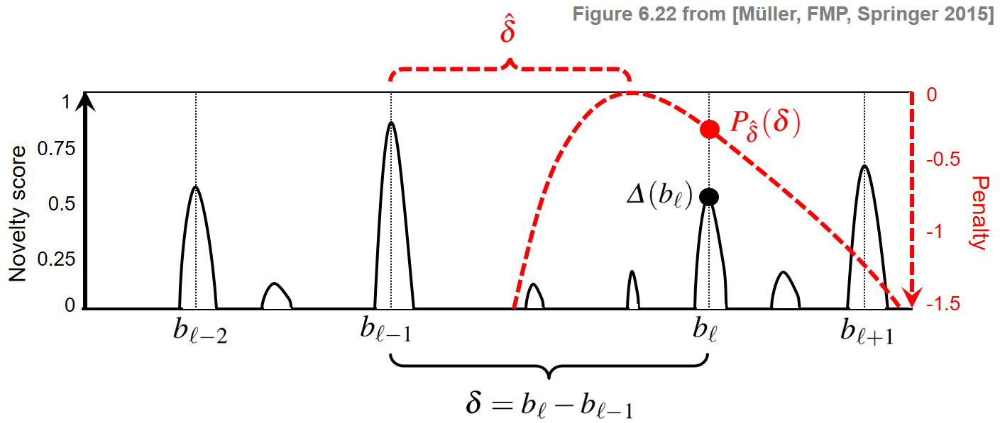

In [17]:
Image(path_img+"FMP_C6_F22.png", width=600)

## 동적 프로그래밍 알고리즘

- 가능한 비트 시퀀스의 수는 $N$에서 기하급수적이다. 그러나 **동적 프로그래밍**을 사용하여 최적의 비트 시퀀스를 효율적으로 계산할 수 있다. 비용 최소화 워핑 경로(DTW 알고리즘) 또는 확률 최대화 상태 시퀀스(Viterbi 알고리즘)를 계산할 때 이미 이 알고리즘 패러다임을 본 적이 있다. prefix를 고려하여 최적화 문제를 더 간단한 하위 문제로 나누는 것이다.

- 비트 추적의 맥락에서는 기저의 노벨티 함수의 prefix를 고려한다.

- 좀 더 정확히 말하자면, $\mathcal{B}^N_n\subset\mathcal{B}^N $는 $n\in[0:N]$로 끝나는 모든 비트 시퀀스의 집합을 나타낸다고 하자. 즉, 비트 시퀀스 $B = (b_1,b_2,\ldots,b_L)\in\mathcal{B}^N_n$의 경우 $b_L=n$이다. $n=0$의 경우 가능한 유일한 비트 시퀀스는 빈 비트이다.

- $\mathbf{D}(n):= \max\left\{\mathbf{S}(B) \,\mid\, B\in\mathcal{B}^N_n \right\}$가 $n\in[0:N]$로 끝나는 모든 비트 시퀀스에 대한 최대 점수를 나타낸다고 하자. $\mathbf{D}(n)$ 값은 **누적 점수**(accumulated score)라고도 한다. 그러면 $\mathbf{S}(B^\ast) = \max_{n\in[0:N]} \mathbf{D}(n)$이다. $\mathbf{D}(n)$ 값은 $n=0,1,\ldots,N$에 대해 반복적인 방식으로 계산될 수 있다. 다음 그림은 절차를 설명한다.

- 동적 프로그래밍 덕분에 가능한 모든 비트 시퀀스의 점수를 계산하는 데 필요한 연산의 기하급수적인 수가 $N$의 2차(quadratic) 연산의 수로 줄어든다.

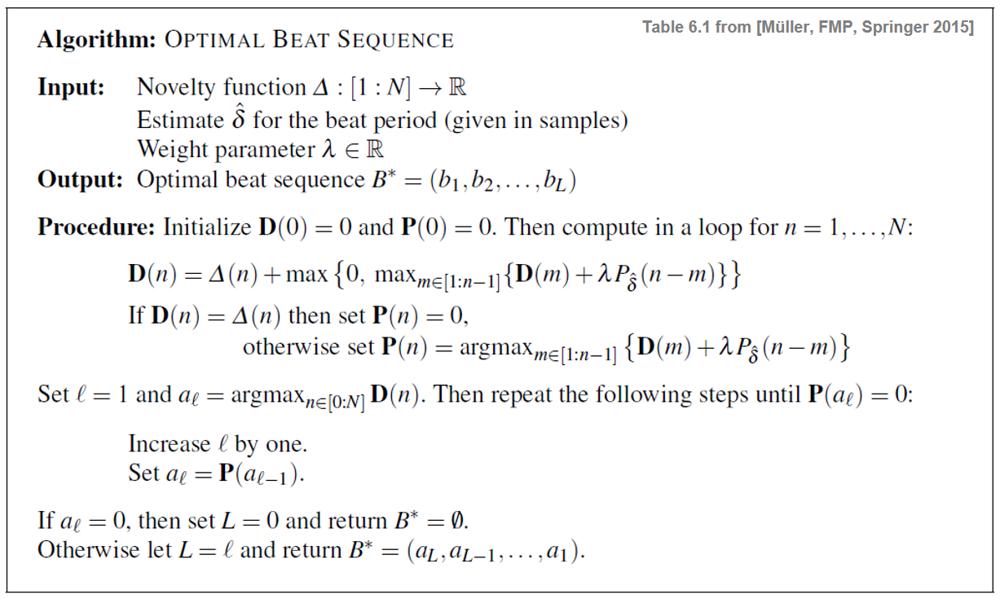

In [18]:
Image(path_img+"FMP_C6_T01.png", width=600)

## 구현

In [19]:
def compute_beat_sequence(novelty, beat_ref, penalty=None, factor=1.0, return_all=False):
    """| Compute beat sequence using dynamic programming [FMP, Section 6.3.2]
    | Note: Concatenation of '0' because of Python indexing conventions

    Args:
        novelty (np.ndarray): Novelty function
        beat_ref (int): Reference beat period
        penalty (np.ndarray): Penalty function (Default value = None)
        factor (float): Weight parameter for adjusting the penalty (Default value = 1.0)
        return_all (bool): Return details (Default value = False)

    Returns:
        B (np.ndarray): Optimal beat sequence
        D (np.ndarray): Accumulated score
        P (np.ndarray): Maximization information
    """
    N = len(novelty)
    if penalty is None:
        penalty = compute_penalty(N, beat_ref)
    penalty = penalty * factor
    novelty = np.concatenate((np.array([0]), novelty))
    D = np.zeros(N+1)
    P = np.zeros(N+1, dtype=int)
    D[1] = novelty[1]
    P[1] = 0
    # forward calculation
    for n in range(2, N+1):
        m_indices = np.arange(1, n)
        scores = D[m_indices] + penalty[n-m_indices]
        maxium = np.max(scores)
        if maxium <= 0:
            D[n] = novelty[n]
            P[n] = 0
        else:
            D[n] = novelty[n] + maxium
            P[n] = np.argmax(scores) + 1
    # backtracking
    B = np.zeros(N, dtype=int)
    k = 0
    B[k] = np.argmax(D)
    while P[B[k]] != 0:
        k = k+1
        B[k] = P[B[k-1]]
    B = B[0:k+1]
    B = B[::-1]
    B = B - 1
    if return_all:
        return B, D, P
    else:
        return B

In [20]:
# Example from Exercise 6.12 of [Müller, FMP, Springer 2015]
nov = np.array([0.1, 0.0, 1.0, 0.0, 1.0, 0.8, 0.0, 0.2, 0.4, 1.0, 0.0])
# Manually specified penality values (in practice, we use the function "compute_penalty")
penalty = np.array([0, -2, -0.2, 1.0, 0.5, -0.1, -1, -1.5, -3, -5, -8])
factor  = 1
beat = 3 

B,D,P = compute_beat_sequence(nov, beat, penalty=penalty, factor=1, return_all=True)    
df = pd.DataFrame([np.arange(1,len(nov)+1), nov, D[1:], P[1:]])
df.rename(index={0:'$n$', 1:'$\Delta(n)$',
                 2:'$\mathbf{D}(n)$', 3:'$\mathbf{P}(n)$'}, inplace=True)
df.rename_axis('$n$', axis='rows')

class Formatter(): 
    """Cass for converting column to row format 
    Notebook: C6/C6S3_BeatTracking.ipynb"""
    def __init__(self):
        self.i = 0
    def formatter(self, s):
        if self.i == 0 or self.i == 3:
            return_s = str(int(s))
        else:
            return_s = str(s)
        self.i += 1
        return return_s

ipd.display(ipd.HTML(df.to_html(formatters={i: Formatter().formatter for i in df.columns}, 
                                escape=False, header=False)))

print('Optimal beat sequency B:', B+1)

$n$,1,2,3,4,5,6,7,8,9,10,11
$\Delta(n)$,0.1,0.0,1.0,0.0,1.0,0.8,0.0,0.2,0.4,1.0,0.0
$\mathbf{D}(n)$,0.1,0.0,1.0,1.1,2.0,2.8,2.1,3.2,4.2,4.3,4.2
$\mathbf{P}(n)$,0,0,0,1,2,3,4,5,6,6,8


Optimal beat sequency B: [ 3  6 10]


**예: Shostakovich**

- 비트 트래킹 절차의 인풋으로 샘플링 레이트 $F_\mathrm{s}^\Delta = 100~\mathrm{Hz}$의 스펙트럼 기반 노벨티 함수를 사용한다. 지배적 템포 200에서 300BPM사이를 기대하여 $\hat{\tau}=240~\mathrm{BPM}$에 해당하는 $\hat{\delta}=25$로 설정한다.

In [21]:
def beat_period_to_tempo(beat, Fs):
    """Convert beat period (samples) to tempo (BPM) [FMP, Section 6.3.2]

    Args:
        beat (int): Beat period (samples)
        Fs (scalar): Sample rate

    Returns:
        tempo (float): Tempo (BPM)
    """
    tempo = 60 / (beat / Fs)
    return tempo
    
    
def compute_plot_sonify_beat(x, Fs, nov, Fs_nov, beat_ref, factor, title=None, figsize=(6, 2)):
    """Compute, plot, and sonfy beat sequence from novelty function [FMP, Section 6.3.2]

    Args:
        x: Novelty function
        Fs: Sample rate
        nov: Novelty function
        Fs_nov: Rate of novelty function
        beat_ref: Reference beat period
        factor: Weight parameter for adjusting the penalty
        title: Title of figure (Default value = None)
        figsize: Size of figure (Default value = (6, 2))
    """
    B = compute_beat_sequence(nov, beat_ref=beat_ref, factor=factor)

    beats = np.zeros(len(nov))
    beats[np.array(B, dtype=np.int32)] = 1
    if title is None:
        tempo = beat_period_to_tempo(beat_ref, Fs_nov)
        title = (r'Optimal beat sequence ($\hat{\delta}=%d$, $F_\mathrm{s}=%d$, '
                 r'$\hat{\tau}=%0.0f$ BPM, $\lambda=%0.2f$)' % (beat_ref, Fs_nov, tempo, factor))

    fig, ax, line = plot_signal(nov, Fs_nov, color='k', title=title, figsize=figsize)
    T_coef = np.arange(nov.shape[0]) / Fs_nov
    ax.plot(T_coef, beats, ':r', linewidth=1)
    plt.show()

    beats_sec = T_coef[B]
    x_peaks = librosa.clicks(times=beats_sec, sr=Fs, click_freq=1000, length=len(x))
    ipd.display(ipd.Audio(x + x_peaks, rate=Fs))

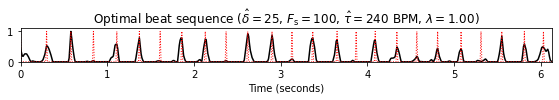

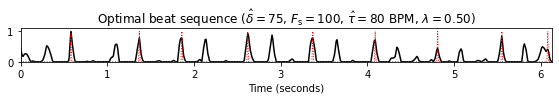

In [22]:
fn_wav = 'FMP_C6_F07_Shostakovich_Waltz-02-Section_IncreasingTempo.wav'
x, Fs = librosa.load(path_data+fn_wav) 

nov, Fs_nov = compute_novelty_spectrum(x, Fs=Fs, N=2048, H=512, gamma=100, M=10, norm=True)
nov, Fs_nov = resample_signal(nov, Fs_in=Fs_nov, Fs_out=100)

compute_plot_sonify_beat(x, Fs, nov, Fs_nov, beat_ref=25, factor=1, figsize=(8,1.5))
compute_plot_sonify_beat(x, Fs, nov, Fs_nov, beat_ref=75, factor=0.5, figsize=(8,1.5))

- 첫번째 결과를 보면 비트가 잘 감지된다.
- 두번째로 $\hat{\tau}=80~\mathrm{BPM}$ 템포를 가정하여 "measure" 수준의 최적 비트 시퀀스를 찾는다.$\hat{\delta}=75$로 설정하면 결과가 기대한 것처럼 나오지 않는다. 이유는 3/4미터 안의 다운비트(노벨티 함수로 측정)는 다른 비트보다 훨씬 약하기 때문이다.

## 한계점

- 비트 추적 절차의 주요 한계점은 미리 정의된 단일 템포 $\hat{\tau}$에 대한 종속성(dependency)이다. 
- 작은 가중치 매개변수 $\lambda$를 사용하면 이상적인 비트 주기 $\hat{\delta}$에서 로컬적으로 편차가 있는 경우에도 좋은 비트 추적 결과를 얻을 수 있다. 
- 그러나 제시된 절차는 천천히 변화하는 템포(예: 리타르단도 또는 악셀레란도) 또는 급격한 템포 변화로 음악을 처리하도록 설계되지 않았다. 이러한 한계점에도 불구하고 비트 추적에 대한 동적 프로그래밍 접근 방식의 단순성과 효율성으로 인해 다양한 유형의 음악에 사용될 수 있다.


- 비트 추적기의 동작을 설명하기 위해 오케스트라의 작은 발췌부분($t_1=35~\mathrm{sec}$에서 $t_2=53~\mathrm{sec}$까지의 섹션)을 고려하여 까다로운 예를 사용해보자. 브람스의 헝가리 무곡 5번 녹음의 발췌 부분은 몇 가지 갑작스러운 템포 변경으로 인해 비트 추적이 어렵다. 또한, 인풋의 노벨티 함수는 부드럽고 흐릿한 온셋으로 인해 잡음이 매우 많다.

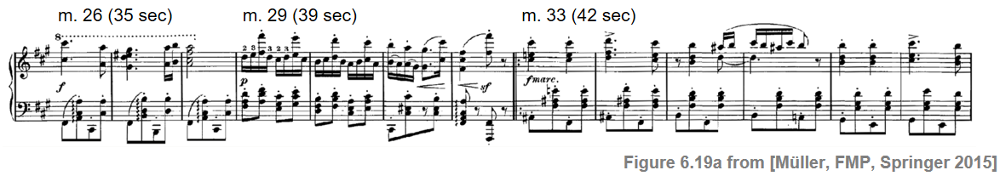

In [23]:
Image(path_img+"FMP_C6_F19a.png", width=700)

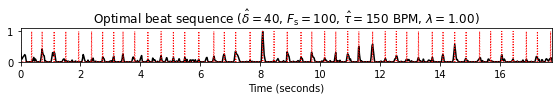

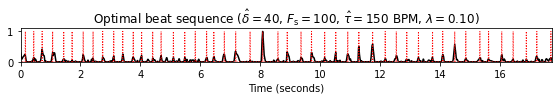

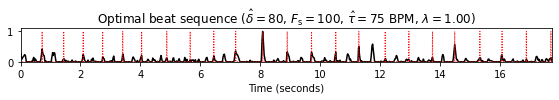

In [24]:
fn_wav = 'FMP_C6_F19_Brahms_Ormandy_sec35-53.wav'
x, Fs = librosa.load(path_data+fn_wav) 

nov, Fs_nov = compute_novelty_spectrum(x, Fs=Fs, N=2048, H=512, gamma=100, M=10, norm=True)
nov, Fs_nov = resample_signal(nov, Fs_in=Fs_nov, Fs_out=100)

beat_ref, factor = 40, 1
tempo = beat_period_to_tempo(beat_ref, Fs_nov)
compute_plot_sonify_beat(x, Fs, nov, Fs_nov, beat_ref=beat_ref, factor=factor, figsize=(8, 1.5))

beat_ref, factor = 40, 0.1
tempo = beat_period_to_tempo(beat_ref, Fs_nov)
compute_plot_sonify_beat(x, Fs, nov, Fs_nov, beat_ref=beat_ref, factor=factor, figsize=(8, 1.5))
   
beat_ref, factor = 80, 1
tempo = beat_period_to_tempo(beat_ref, Fs_nov)
compute_plot_sonify_beat(x, Fs, nov, Fs_nov, beat_ref=beat_ref, factor=factor, figsize=(8, 1.5))

# 적응형 윈도우잉 (Adaptive Windowing)

- 거의 모든 음악 분석 작업에서 중요한 단계 중 하나는 주어진 오디오 신호를 특정 음악적 속성을 캡처하는 적절한 특징(feature) 표현으로 변환하는 것이다. 대부분의 음악적 속성은 시간이 지남에 따라 달라지기 때문에 주어진 오디오 신호는 일반적으로 세그먼트 또는 프레임으로 분할된 다음 개별적으로 추가 처리된다.

- 기본 가정은 신호가 캡처할 속성과 관련하여 각 세그먼트 내에서 (대략) 정상적(stationary) 상태를 유지한다는 것이다. 실제로 단기 푸리에 변환(STFT)의 경우와 마찬가지로 고정 크기(fixed-size)의 미리 정의된 윈도우는 시간 로컬화(localization)에 사용되며 크기는 경험적으로 결정되고 염두에 두고 있는 특정 응용에 맞게 최적화된다.

- 그러나 **고정 크기 윈도우**를 사용하면 동질성(homogeneity) 가정이 위반될 수 있다. 윈도우 섹션 결과의 경계는 종종 신호 변경이 발생하는 위치와 일치하지 않는다. 고정 크기 윈도우의 대안으로 이전에 추출된 시작 및 비트 위치에 의해 세그먼트 경계가 유도되는, 보다 음악적으로 의미 있는 **적응 윈도우잉**(**adpative windowing**) 전략을 사용할 수 있다. 

- 음악적 변화는 일반적으로 온셋 위치에서 발생하기 때문에 적응적으로 결정된 프레임 내에서 동질성이 증가하고 결과로 피처 퀄리티가 크게 향상되는 경우가 많다.

**예시: C-Major Scale**

- 예시를 위해 피아노로 연주되는 C장조 음계의 오디오 녹음을 보자.

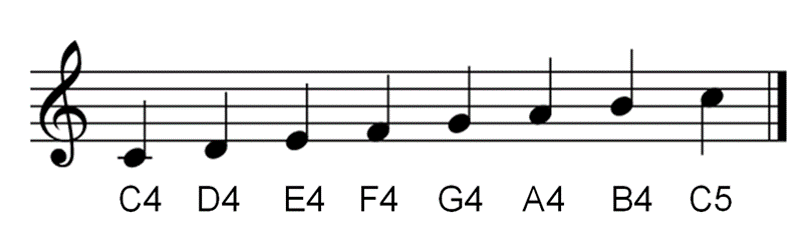

In [25]:
ipd.display(Image(path_img+"FMP_C6_F24_ScaleMajorC.png", width=300))
ipd.display(Audio(path_data+"FMP_C6_F24_ScaleMajorC-middle.wav"))

- 다음 그림은 고정 크기 윈도우를 사용한 오디오 발췌 부분의 크로마 표현을 보여준다. 인덱스가 $n=3$($t=1.5~\mathrm{sec}$와 $t=2~\mathrm{sec}$ 사이)인 프레임을 자세히 살펴보자. 이 프레임에는 크로마 밴드가 $\mathrm{D}$ 및 $\mathrm{E}$의 두 가지 다른 음표 에너지를 포함하는 다소 노이지한 크로마 특징으로 이어지는 음 변경이 포함되어 있다.

In [26]:
def plot_beat_grid(B_sec, ax, color='r', linestyle=':', linewidth=1):
    """Plot beat grid (given in seconds) into axis

    Args:
        B_sec: Beat grid
        ax: Axes for plotting
        color: Color of lines (Default value = 'r')
        linestyle: Style of lines (Default value = ':')
        linewidth: Width of lines (Default value = 1)
    """
    for b in B_sec:
        ax.axvline(x=b, color=color, linestyle=linestyle, linewidth=linewidth)

In [27]:
fn_wav = 'FMP_C6_F24_ScaleMajorC-middle.wav'
x, Fs = librosa.load(path_data+fn_wav) 

N, H = 1024, 512
X = librosa.stft(y=x, n_fft=N, hop_length=H, win_length=N, center=True, window='hann')
Y = np.abs(X)
C = librosa.feature.chroma_stft(S=Y, sr=Fs, norm=1, hop_length=H, n_fft=N)

B_num = 10
B_fix_sec = np.linspace(0, x.shape[0], B_num) / Fs
B_fix_frame = (B_fix_sec*Fs/H).astype(int)
C_fix = librosa.util.sync(C, B_fix_frame)

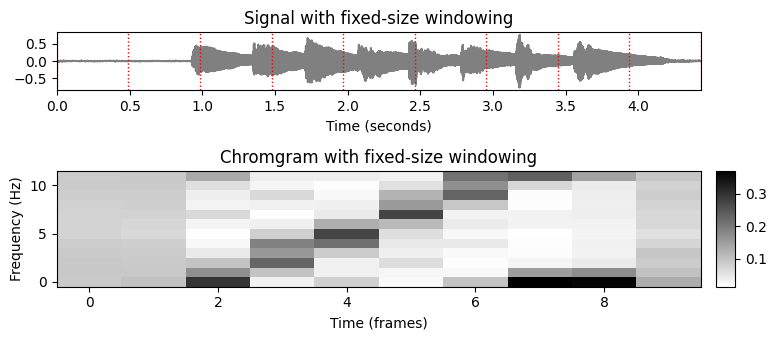

In [28]:
# Visualization
fig, ax = plt.subplots(2, 2, gridspec_kw={'width_ratios': [1, 0.03], 
                                          'height_ratios': [1, 2]}, figsize=(8,3.5)) 

plot_signal(x, Fs, ax=ax[0,0], 
                     title='Signal with fixed-size windowing')
ax[0,1].set_axis_off()
plot_beat_grid(B_fix_sec, ax[0,0])
    
plot_matrix(C_fix, ax=[ax[1,0], ax[1,1]], xlabel='Time (frames)', 
                     title='Chromgram with fixed-size windowing')
plt.tight_layout()

- 이제 음 온셋에 의한 적응형 윈도우 기능을 소개한다. 다음 그림에서 볼 수 있듯이 적응형 윈도우는 8개 음의 특징을 훌륭하게 포착하는 깨끗한 크로마 특징으로 이어진다. 

- 다음 구현 및 예와 관련하여 몇 가지 참고 사항이 있다.
    * (`B_sec`, `B_adapt_sec` 또는 `B_fix_sec`로 표시된 코드에서)시간 그리드를 초 단위로 지정한다.
    * `librosa.util.sync` 함수를 사용하면 주어진 시간 그리드에 맞는 특징 표현을 계산할 수 있다. 이 경우 시간 그리드를 특징 표현과 일치하는 프레임 인덱스로 변환해야 한다.
    * 이 예에서는 고정 크기 윈도우를 기반으로 하는 시간 그리드에서 계산된 크로마 표현을 사용하며, 이는 더 거친 그리드(`B_adapt_sec` 또는 `B_fix_sec`로 지정됨)에 적용된다.
    * 더 미세한 격자에서 표현을 계산할 때 centered view를 사용하는데, 이는 더 거친 격자에서도 약간의 "번짐"을 유발할 수 있다. 이 효과를 피하기 위해 `center=False` 매개변수를 사용할 수도 있다.

In [29]:
nov, Fs_nov = compute_novelty_spectrum(x, Fs=Fs, N=512, H=256, 
                                                 gamma=100, M=10, norm=True)
nov, Fs_nov = resample_signal(nov, Fs_in=Fs_nov, Fs_out=100)

peaks, properties = signal.find_peaks(nov, prominence=0.2)
B_adapt_sec = peaks/Fs_nov
B_adapt_frame = (B_adapt_sec*Fs/H).astype(int)
C_adapt = librosa.util.sync(C, B_adapt_frame, aggregate=np.mean)

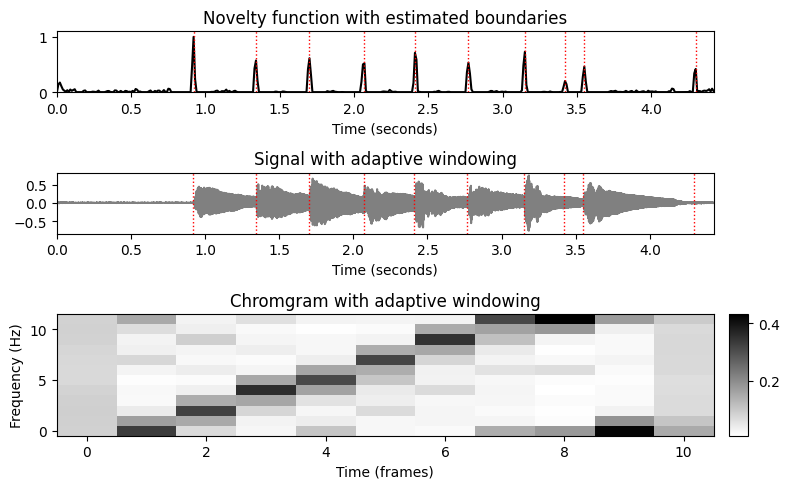

In [30]:
# Visualization
fig, ax = plt.subplots(3, 2, gridspec_kw={'width_ratios': [1, 0.03], 
                                          'height_ratios': [1, 1, 2]}, figsize=(8,5)) 

plot_signal(nov, Fs_nov, color='k', ax=ax[0,0],
                    title='Novelty function with estimated boundaries')
ax[0,1].set_axis_off()
plot_beat_grid(B_adapt_sec, ax[0,0])

plot_signal(x, Fs, ax=ax[1,0],
                    title='Signal with adaptive windowing')
ax[1,1].set_axis_off()
plot_beat_grid(B_adapt_sec, ax[1,0])

plot_matrix(C_adapt, ax=[ax[2,0], ax[2,1]], xlabel='Time (frames)',
                    title='Chromgram with adaptive windowing')

plt.tight_layout()

## 비트-동기(Beat-Synchronous) 특징 표현

- 비트 정보를 기반으로 하는 적응 윈도우 기술은 많은 음악 분석 및 검색 응용에서 특히 중요하다. 이 경우 윈도우 영역은 2개의 연속된 비트 위치에 의해 결정되므로 비트당 하나의 특징 벡터가 생성된다. 

- 이러한 **비트-동기**(**beat-synchronous**) 특징 표현은 물리적 시간 축(초 단위)이 아닌 음악적 시간 축(비트 단위)을 소유한다는 이점이 있다. 이렇게 하면 템포(BPM 단위)의 차이에 대한 특징 표현이 견고해진다. 

- 음악 동기화(music synchronization)의 맥락에서 비트 동기화 기능을 사용하면 DTW와 같은 정렬 기술이 쓸모 없게 될 수 있다(적어도 완벽한 비트 위치를 갖는 이상적인 경우). 예를 들어, 비트 위치를 아는 것은 이미 동일한 악보를 따르는 두 가지 다른 연주의 비트별 동기화를 생성한다.

- 실제로 이러한 전략은 특히 비트 위치가 자동으로 결정될 때 주의해서 다루어야 한다. 일반적으로 자동화된 비트 추적 절차는 타악기의 온셋과 일정한 템포의 음악에 적합하다. 그러나 로컬 템포 변화가 있는 약한 음 온셋 및 표현력이 풍부한 음악을 처리할 때, 자동화된 비트 위치 생성은 템포 옥타브 혼란과 관련된 문제는 물론이고 오류가 발생하기 쉬운 작업이 된다. 

- 특징 추출 단계에서 손상된 비트 정보를 사용하면 이후에 해결해야 할 음악 처리 작업에 막대한 영향을 미칠 수 있다. 예를 들어, 음악 동기화 맥락에서 비트 추적 오류를 보상하기 위해 DTW와 같은 오류 허용 기술을 다시 도입해야 할 수 있다.

**예시: Shostakovich**

- 비트-동기 피처를 사용하는 예로 Shostakovich 발췌부분을 사용한다.

In [31]:
fn_wav = 'FMP_C6_F07_Shostakovich_Waltz-02-Section_IncreasingTempo.wav'
x, Fs = librosa.load(path_data+fn_wav) 

nov, Fs_nov = compute_novelty_spectrum(x, Fs=Fs, N=2048, H=512, 
                                                 gamma=100, M=10, norm=True)
nov, Fs_nov = resample_signal(nov, Fs_in=Fs_nov, Fs_out=100)

L_nov = len(nov)
N_nov = 500
H_nov = 10
Theta = np.arange(30, 601)
X, T_coef, F_coef_BPM = compute_tempogram_fourier(nov, Fs=Fs_nov, 
                                                            N=500, H=10, Theta=Theta)
nov_PLP = compute_plp(X, Fs_nov, L_nov, N_nov, H_nov, Theta)
peaks, properties = signal.find_peaks(nov_PLP, prominence=0.02)
B_adapt_sec = peaks / Fs_nov

N, H = 1024, 512
X = librosa.stft(y=x, n_fft=N, hop_length=H, win_length=N, center=True, window='hann')
Y = np.abs(X)
C = librosa.feature.chroma_stft(S=Y, sr=Fs, norm=1, hop_length=H, n_fft=N)
B_fix_frame = (B_adapt_sec*Fs/H).astype(int)
C_adapt = librosa.util.sync(C, B_fix_frame, aggregate=np.mean)

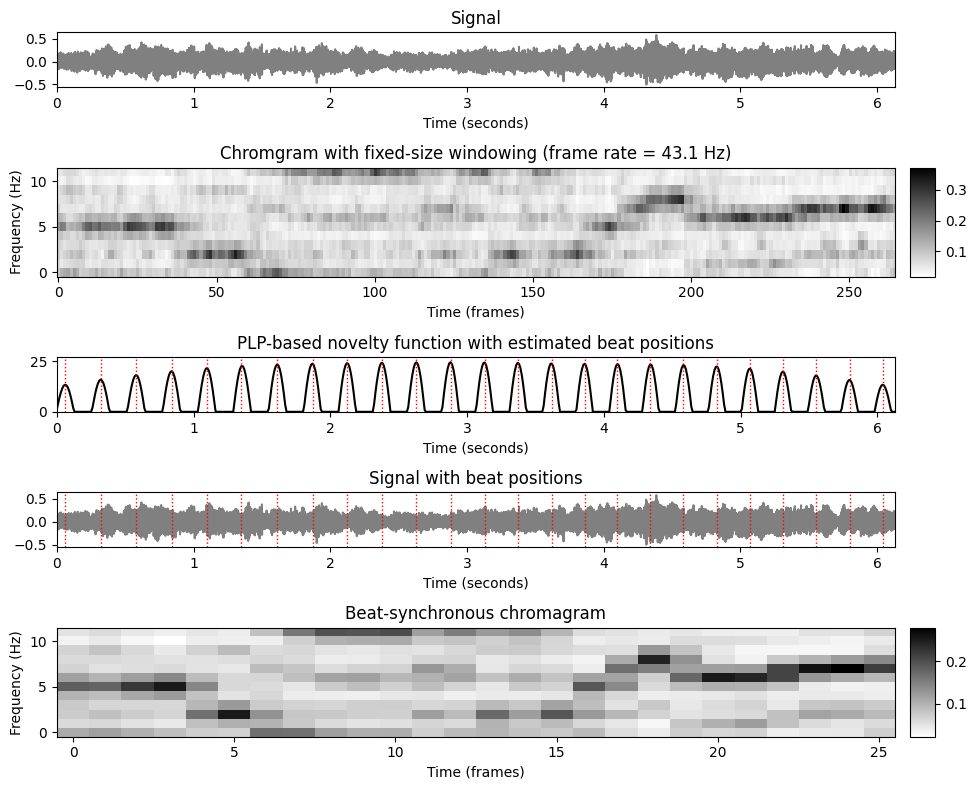

In [32]:
ipd.display(Audio(data=x,rate=Fs))
# Visualization
fig, ax = plt.subplots(5, 2, gridspec_kw={'width_ratios': [1, 0.03], 
                                          'height_ratios': [1, 2, 1, 1, 2]}, figsize=(10,8)) 

plot_signal(x, Fs, ax=ax[0,0], title='Signal')
ax[0,1].set_axis_off()
    
plot_matrix(C, ax=[ax[1,0], ax[1,1]], xlabel='Time (frames)', 
                     title='Chromgram with fixed-size windowing (frame rate = %0.1f Hz)'%(Fs/H))

plot_signal(nov_PLP, Fs_nov, color='k', ax=ax[2,0],
                    title='PLP-based novelty function with estimated beat positions')
ax[2,1].set_axis_off()
plot_beat_grid(B_adapt_sec, ax[2,0])

plot_signal(x, Fs, ax=ax[3,0],
                    title='Signal with beat positions')
ax[3,1].set_axis_off()
plot_beat_grid(B_adapt_sec, ax[3,0]) 

plot_matrix(C_adapt, ax=[ax[4,0], ax[4,1]], xlabel='Time (frames)',
                    title='Beat-synchronous chromagram')

plt.tight_layout()

## 트랜지언트 제거 (Transient Removal)

- 다음으로 오디오 특징의 품질을 개선하기 위해 온셋 및 비트 위치에 대한 지식을 다른 방식으로 사용할 수 있는 방법을 보자.

- 특히 피아노, 기타 또는 타악기와 같은 악기의 경우 음 온셋이 전체 스펙트럼에 걸쳐 퍼지는 **트랜지언트**(**transients**)(노이즈와 같은 에너지 폭발)을 동반하는 경우가 많다. 트랜지언트가 음 온셋 위치를 감지하는 데 유용하지만 화성 또는 멜로디 정보를 캡처하는 피처에서 원하지 않는 부산물을 유발할 수 있다.

- 화성 정보를 유지하면서 이러한 잡음과 같은 부산물을 제거하기 위한 한 가지 방법은 각 음 온셋 위치 주변의 이웃을 제외하는 것이다. 이를 위해 이웃의 크기를 결정하는 $\lambda\in\mathbb{R}$, $0<\lambda<1$ 매개변수를 도입한다. $s,t\in[1:N]$가 주어진 적응형 윈도우의 시작 및 끝 위치를 나타낸다고 하자. 그러면 다음과 같이 정의할 수 있다.
$$s_\lambda := s + \left\lfloor \frac{1-\lambda}{2}(t-s)\right\rfloor \,\,\,\mbox{and}\,\,\,
      t_\lambda := t - \left\lfloor \frac{1-\lambda}{2}(t-s)\right\rfloor,$$
    - 이는 피처 계산에 사용되는 단축된 윈도우의 시작 및 끝 위치를 결정한다.
    
- 이 정의를 사용하면 적응형 윈도우의 중심이 유지되는 반면 크기는 원래 크기 $(t-s)$에 비해 $\lambda$만큼 줄어든다.

- 다음 코드 셀의 예에서는 특징 표현으로 $\lambda=1$를 한 번 사용하고 $\lambda=0.5$를 한 번 사용하여 적응형 윈도우를 사용한 크기 스펙트럼을 보여준다. 그러나 이 예에서는 신호 트랜지언트 현상을 제거했기 때문에 노이즈 제거 효과를 거의 볼 수 없다.

In [33]:
def adaptive_windowing(X, B, neigborhood=1, add_start=False, add_end=False):
    """Apply adaptive windowing [FMP, Section 6.3.3]

    Args:
        X (np.ndarray): Feature sequence
        B (np.ndarray): Beat sequence (spefied in frames)
        neigborhood (float): Parameter specifying relative range considered for windowing (Default value = 1)
        add_start (bool): Add first index of X to beat sequence (if not existent) (Default value = False)
        add_end (bool): Add last index of X to beat sequence (if not existent) (Default value = False)

    Returns:
        X_adapt (np.ndarray): Feature sequence adapted to beat sequence
        B_s (np.ndarray): Sequence specifying start (in frames) of window sections
        B_t (np.ndarray): Sequence specifying end (in frames) of window sections
    """
    len_X = X.shape[1]
    max_B = np.max(B)
    if max_B > len_X:
        print('Beat exceeds length of features sequence (b=%d, |X|=%d)' % (max_B, len_X))
        B = B[B < len_X]
    if add_start:
        if B[0] > 0:
            B = np.insert(B, 0, 0)
    if add_end:
        if B[-1] < len_X:
            B = np.append(B, len_X)
    X_adapt = np.zeros((X.shape[0], len(B)-1))
    B_s = np.zeros(len(B)-1).astype(int)
    B_t = np.zeros(len(B)-1).astype(int)
    for b in range(len(B)-1):
        s = B[b]
        t = B[b+1]
        reduce = np.floor((1 - neigborhood)*(t-s+1)/2).astype(int)
        s = s + reduce
        t = t - reduce
        if s == t:
            t = t + 1
        X_slice = X[:, range(s, t)]
        X_adapt[:, b] = np.mean(X_slice, axis=1)
        B_s[b] = s
        B_t[b] = t
    return X_adapt, B_s, B_t

In [34]:
def compute_plot_adaptive_windowing(x, Fs, H, X, B, neigborhood=1, add_start=False, add_end=False):
    """Compute and plot process for adaptive windowing [FMP, Section 6.3.3]

    Args:
        x (np.ndarray): Signal
        Fs (scalar): Sample Rate
        H (int): Hop size
        X (int): Feature sequence
        B (np.ndarray): Beat sequence (spefied in frames)
        neigborhood (float): Parameter specifying relative range considered for windowing (Default value = 1)
        add_start (bool): Add first index of X to beat sequence (if not existent) (Default value = False)
        add_end (bool): Add last index of X to beat sequence (if not existent) (Default value = False)

    Returns:
        X_adapt (np.ndarray): Feature sequence adapted to beat sequence
    """
    X_adapt, B_s, B_t = adaptive_windowing(X, B, neigborhood=neigborhood,
                                           add_start=add_start, add_end=add_end)

    fig, ax = plt.subplots(2, 2, gridspec_kw={'width_ratios': [1, 0.03],
                                              'height_ratios': [1, 3]}, figsize=(10, 4))

    plot_signal(x, Fs, ax=ax[0, 0], title=r'Adaptive windowing using $\lambda = %0.2f$' % neigborhood)
    ax[0, 1].set_axis_off()
    plot_beat_grid(B_s * H / Fs, ax[0, 0], color='b')
    plot_beat_grid(B_t * H / Fs, ax[0, 0], color='g')
    plot_beat_grid(B * H / Fs, ax[0, 0], color='r')
    for k in range(len(B_s)):
        ax[0, 0].fill_between([B_s[k] * H / Fs, B_t[k] * H / Fs], -1, 1, facecolor='red', alpha=0.1)

    plot_matrix(X_adapt, ax=[ax[1, 0], ax[1, 1]], xlabel='Time (frames)', ylabel='Frequency (bins)')
    plt.tight_layout()
    return X_adapt

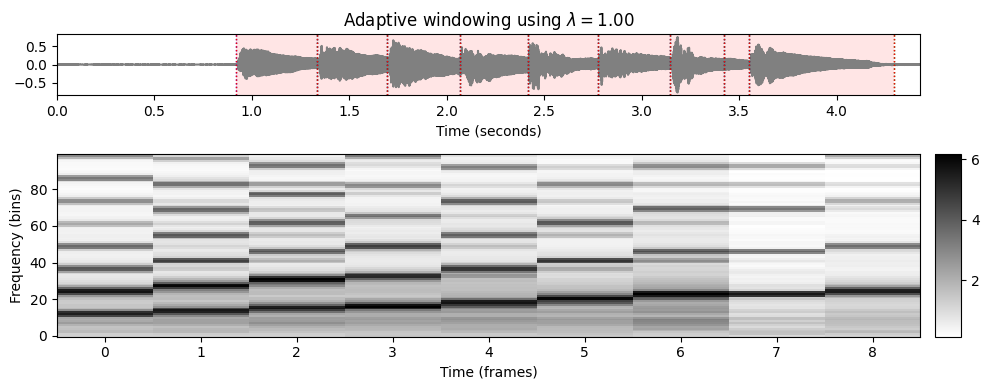

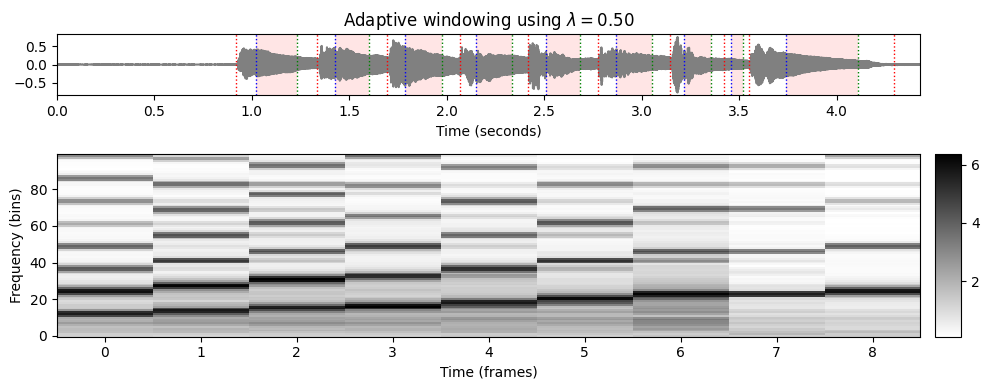

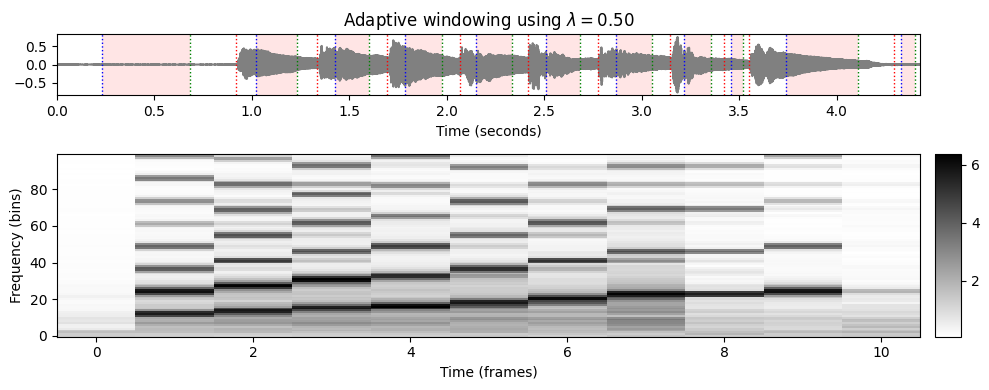

In [35]:
fn_wav = 'FMP_C6_F24_ScaleMajorC-middle.wav'
x, Fs = librosa.load(path_data+fn_wav) 
ipd.display(Audio(data=x,rate=Fs))

N, H = 1024, 256
X = librosa.stft(y=x, n_fft=N, hop_length=H, win_length=N, center=True, window='hann')
X = X[0:100,:]
Y = np.log(1+ 10*np.abs(X))

nov, Fs_nov = compute_novelty_spectrum(x, Fs=Fs, N=512, H=256, 
                                                 gamma=100, M=10, norm=True)
nov, Fs_nov = resample_signal(nov, Fs_in=Fs_nov, Fs_out=100)

peaks, properties = signal.find_peaks(nov, prominence=0.2)
B_adapt_sec = peaks/Fs_nov

add_start = False
add_end = False
neigborhood = 1
B_adapt_frame = np.round(B_adapt_sec*Fs/H).astype(int)
Y_adapt = compute_plot_adaptive_windowing(x, Fs, H, Y, B_adapt_frame, 
                        neigborhood=neigborhood, add_start=add_start, add_end=add_end)
neigborhood = 0.5
Y_adapt = compute_plot_adaptive_windowing(x, Fs, H, Y, B_adapt_frame, 
                        neigborhood=neigborhood, add_start=add_start, add_end=add_end)

add_start = True
add_end = True
neigborhood = 0.5
Y_adapt = compute_plot_adaptive_windowing(x, Fs, H, Y, B_adapt_frame, 
                        neigborhood=neigborhood, add_start=add_start, add_end=add_end)

# Librosa 함수 예제

In [36]:
x, sr = librosa.load('../audio/58bpm.wav')
ipd.Audio(x, rate=sr)

In [37]:
tempo, beat_times = librosa.beat.beat_track(y=x, sr=sr, start_bpm=60, units='time')
print(tempo)
print(beat_times)

58.72691761363637
[1.06811791 2.11301587 3.11147392 4.17959184 5.20126984 6.2461678
 7.2678458 ]


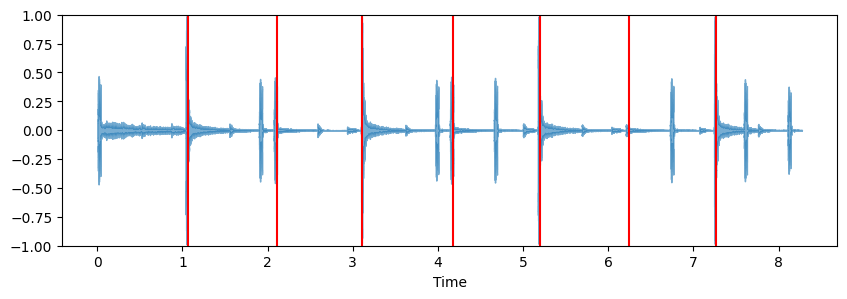

In [38]:
plt.figure(figsize=(10, 3))
librosa.display.waveshow(x, alpha=0.6)
plt.vlines(beat_times, -1, 1, color='r')
plt.ylim(-1, 1)
plt.show()

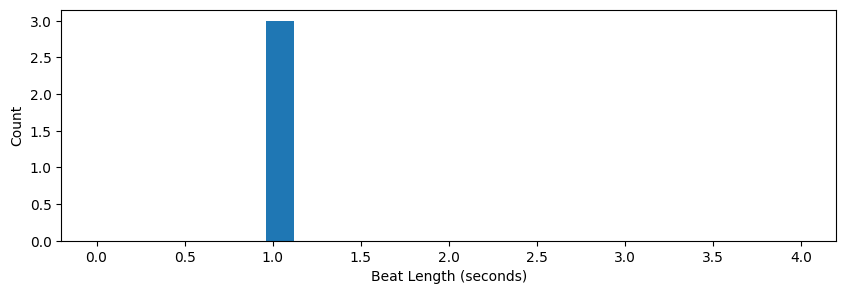

In [39]:
beat_times_diff = np.diff(beat_times)
plt.figure(figsize=(10, 3))
plt.hist(beat_times_diff, bins=50, range=(0,4))
plt.xlabel('Beat Length (seconds)')
plt.ylabel('Count')
plt.show()

In [40]:
clicks = librosa.clicks(times=beat_times, sr=sr, length=len(x))
ipd.Audio(x + clicks, rate=sr)

---

출처: 

- https://www.audiolabs-erlangen.de/resources/MIR/FMP/C6/C6S3_PredominantLocalPulse.html
- https://www.audiolabs-erlangen.de/resources/MIR/FMP/C6/C6S3_BeatTracking.html
- https://www.audiolabs-erlangen.de/resources/MIR/FMP/C6/C6S3_AdaptiveWindowing.html
- https://colab.research.google.com/github/stevetjoa/musicinformationretrieval.com/blob/gh-pages/beat_tracking.ipynb

---

[구글 Colab 링크](https://colab.research.google.com/github/jo-cho/mir_kr/blob/main/Notebooks/7.%20Tempo%20and%20Beat%20Tracking/7.3.Beat_and_Pulse_Tracking.ipynb)